In [2]:
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

In [3]:
adata = sc.read_h5ad('../../../data/multimil_output/adata_full2.h5ad')
adata

AnnData object with n_obs × n_vars = 2149684 × 2000
    obs: "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ancestry', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'assay', 'cause_of_death', 'cell_type', 'core_or_extension', 'dataset', 'development_stage', 'disease', 'donor_id', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'reannotation_type', 'sample', 'scanvi_label', 'sequencing_platform', 'sex', 'smoking_status', 'study', 'subject_type', 'suspension_type', 'tissue', 'tissue_coarse_unharmonized', 'tissue_detailed_unharmonized', 'tissue_dissociation_protocol', 'tissue_level_2', 'tissue_level_3', 'tissue_sampling_method', 'total_counts', 'transf_ann_level_1_label', 'transf_ann_l

In [4]:
np.unique(adata.obs['lung_condition_coarse'])

array(['CF', 'COPD', 'COVID-19', 'Carcinoma', 'Chronic rhinitis',
       'Healthy', 'ILD', 'IPF', 'Pneumonia non-COVID'], dtype=object)

In [5]:
# subset to  vs covid for test
adata = adata[adata.obs['lung_condition_coarse'].isin(['COPD', 'COVID-19'])].copy()
adata

AnnData object with n_obs × n_vars = 361286 × 2000
    obs: "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ancestry', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'assay', 'cause_of_death', 'cell_type', 'core_or_extension', 'dataset', 'development_stage', 'disease', 'donor_id', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'reannotation_type', 'sample', 'scanvi_label', 'sequencing_platform', 'sex', 'smoking_status', 'study', 'subject_type', 'suspension_type', 'tissue', 'tissue_coarse_unharmonized', 'tissue_detailed_unharmonized', 'tissue_dissociation_protocol', 'tissue_level_2', 'tissue_level_3', 'tissue_sampling_method', 'total_counts', 'transf_ann_level_1_label', 'transf_ann_le

# 1d hists

(array([2.2000e+01, 2.0500e+02, 1.5060e+03, 4.6040e+03, 1.0615e+04,
        1.6220e+04, 1.9971e+04, 2.3565e+04, 2.6934e+04, 2.7388e+04,
        2.7269e+04, 2.8193e+04, 3.0201e+04, 2.7405e+04, 2.2458e+04,
        1.8302e+04, 1.6089e+04, 1.3308e+04, 1.1251e+04, 9.4230e+03,
        7.6890e+03, 5.6220e+03, 3.5160e+03, 2.3610e+03, 1.6240e+03,
        1.2870e+03, 9.5200e+02, 6.7500e+02, 5.4700e+02, 4.3800e+02,
        3.4900e+02, 2.5500e+02, 2.1000e+02, 1.7400e+02, 1.5100e+02,
        1.4100e+02, 1.1200e+02, 7.4000e+01, 6.1000e+01, 5.1000e+01,
        2.0000e+01, 1.5000e+01, 1.3000e+01, 2.0000e+00, 5.0000e+00,
        5.0000e+00, 2.0000e+00, 1.0000e+00, 3.0000e+00, 2.0000e+00]),
 array([0.00207308, 0.0025418 , 0.00301052, 0.00347924, 0.00394796,
        0.00441668, 0.0048854 , 0.00535412, 0.00582284, 0.00629156,
        0.00676028, 0.007229  , 0.00769772, 0.00816643, 0.00863515,
        0.00910387, 0.00957259, 0.01004131, 0.01051003, 0.01097875,
        0.01144747, 0.01191619, 0.01238491, 0.

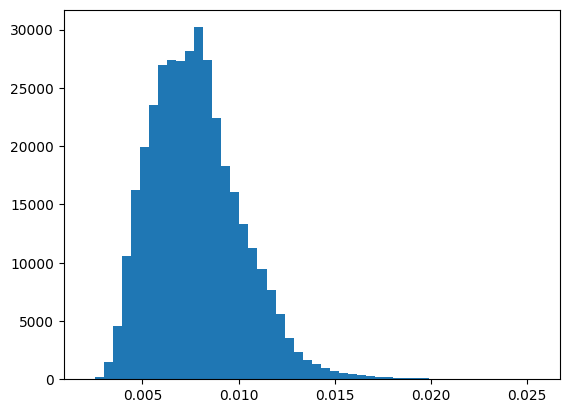

In [5]:
plt.hist(adata.obs['cell_attn'], bins=50)

In [6]:
sc.pp.neighbors(adata, use_rep='latent')

In [7]:
sc.tl.umap(adata)

/Users/anastasia.litinetska/mambaforge/envs/sc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/anastasia.litinetska/mambaforge/envs/sc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


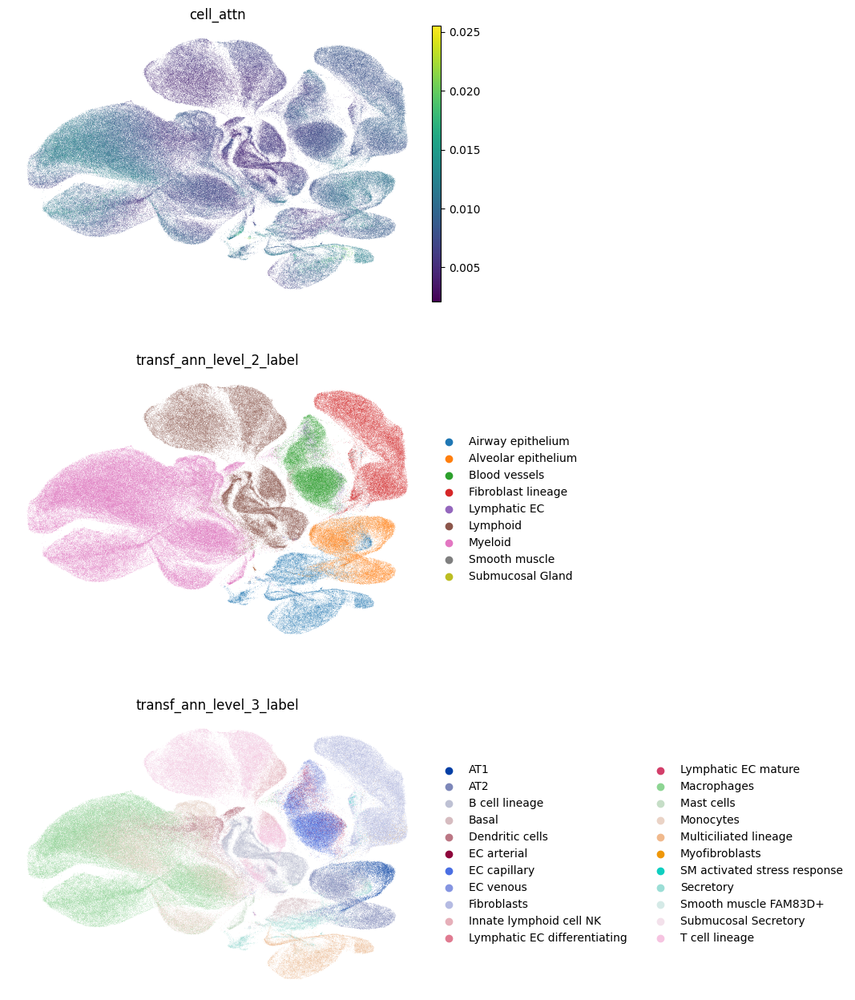

In [12]:
sc.pl.umap(
    adata, 
    color=[
        'cell_attn',
        'transf_ann_level_2_label',
        'transf_ann_level_3_label'
    ],
    frameon=False,
    ncols=1,
)

In [11]:
adata.obs['transf_ann_level_3_label']

052CO-a_CGGACGTAGACGACGT_adams               EC capillary
052CO-a_TTCTTAGTCCATGCTC_adams                Macrophages
052CO-a_CCGGGATGTCTTCGTC_adams                  Monocytes
052CO-a_CAGAATCGTAGAGCTG_adams                Macrophages
052CO-a_ATAAGAGTCGGGAGTA_adams    Innate lymphoid cell NK
                                           ...           
GCGCAGTTCTATCGCC-6_grant_fresh                  Monocytes
TGCCCATCACACCGAC-6_grant_fresh             T cell lineage
GTTCATTAGTGGTCCC-6_grant_fresh                  Monocytes
AGGCCGTCATCGACGC-6_grant_fresh            Dendritic cells
GTCTTCGAGAGTAATC-6_grant_fresh            Dendritic cells
Name: transf_ann_level_3_label, Length: 361286, dtype: category
Categories (22, object): ['AT1', 'AT2', 'B cell lineage', 'Basal', ..., 'Secretory', 'Smooth muscle FAM83D+', 'Submucosal Secretory', 'T cell lineage']

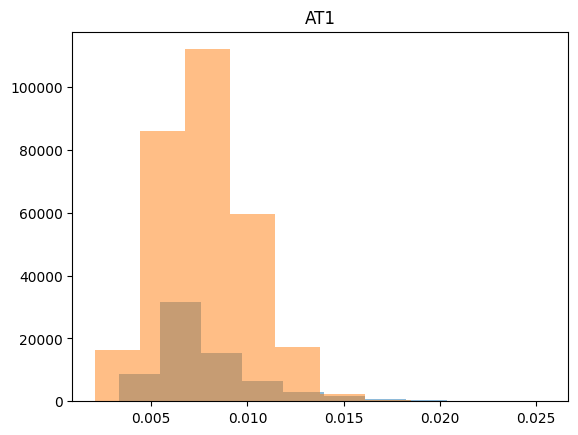

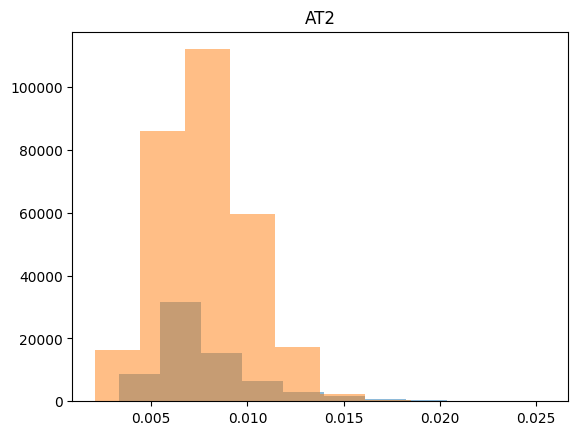

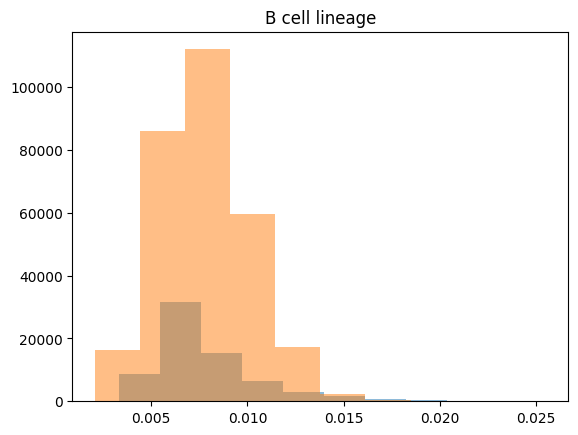

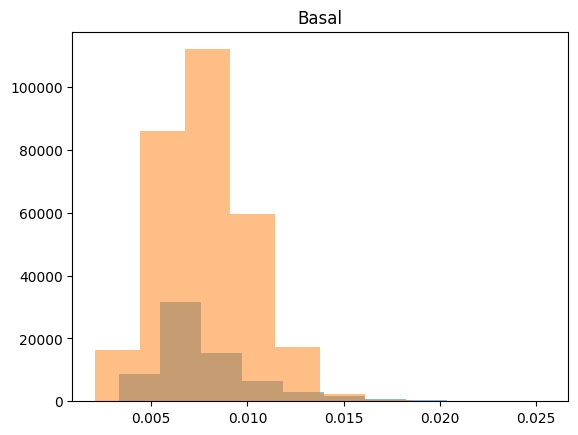

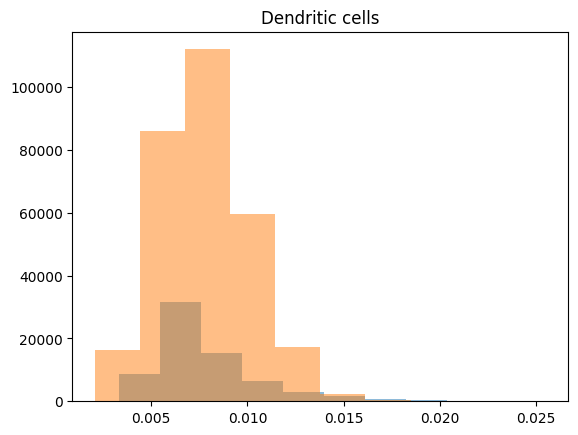

...

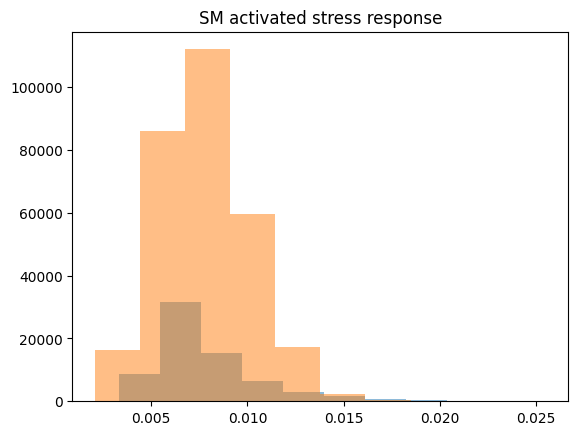

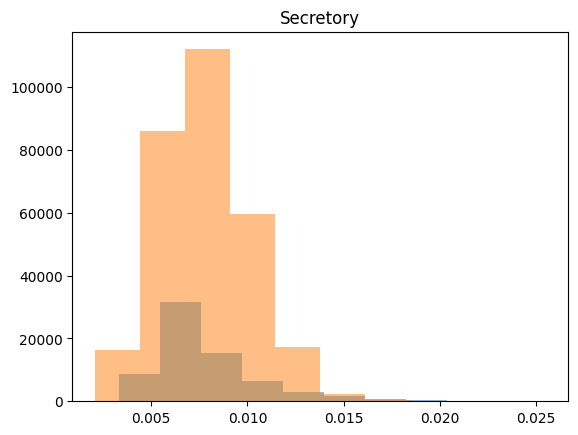

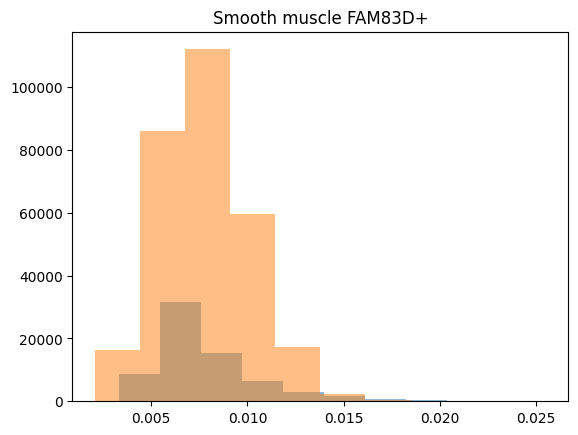

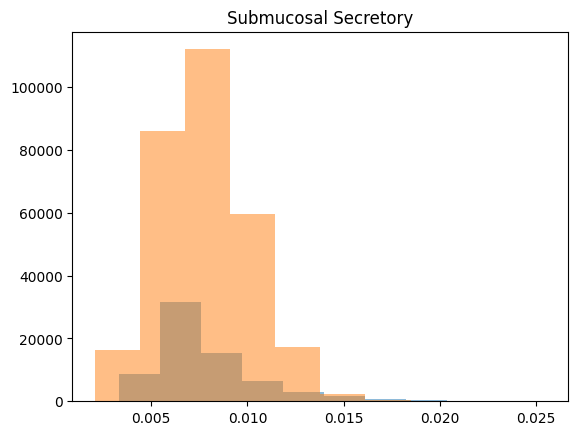

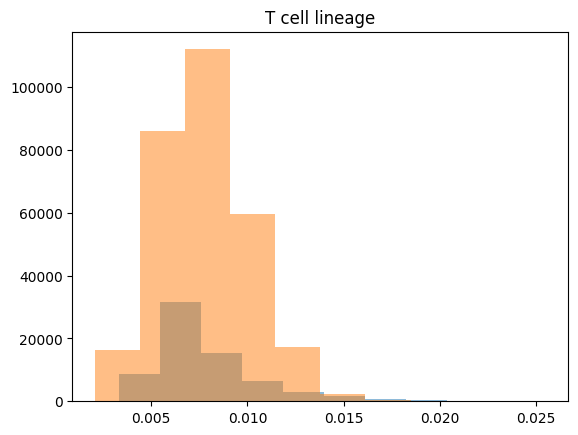

In [21]:
for ct in np.unique(adata.obs['transf_ann_level_3_label']):
    tmp = adata[adata.obs['transf_ann_level_3_label'] == ct].copy()
    tmp1 = adata[adata.obs['lung_condition_coarse'] == 'COPD'].copy()
    tmp2 = adata[adata.obs['lung_condition_coarse'] == 'COVID-19'].copy()
    fig, ax = plt.subplots()
    plt.hist(tmp1.obs['cell_attn'], alpha=0.5)
    plt.hist(tmp2.obs['cell_attn'], alpha=0.5)
    plt.title(ct)
    plt.show()

# top 10% of cells with highest attn score

In [34]:
threshold_idx = int(len(adata) * 0.9)
threshold_value = sorted(adata.obs['cell_attn'])[threshold_idx]
threshold_value

0.010962311178445816

In [38]:
df = adata.obs[['cell_attn']].copy()
df.loc[df['cell_attn'] >= threshold_value, 'attn_importance'] = 1
df.loc[df['cell_attn'] < threshold_value, 'attn_importance'] = 0
df

,cell_attn,attn_importance
052CO-a_CGGACGTAGACGACGT_adams,0.011100,1.0
052CO-a_TTCTTAGTCCATGCTC_adams,0.007245,0.0
052CO-a_CCGGGATGTCTTCGTC_adams,0.009052,0.0
052CO-a_CAGAATCGTAGAGCTG_adams,0.008397,0.0
052CO-a_ATAAGAGTCGGGAGTA_adams,0.007105,0.0
...,...,...
GCGCAGTTCTATCGCC-6_grant_fresh,0.011247,1.0
TGCCCATCACACCGAC-6_grant_fresh,0.005978,0.0
GTTCATTAGTGGTCCC-6_grant_fresh,0.013519,1.0
AGGCCGTCATCGACGC-6_grant_fresh,0.004456,0.0


In [39]:
adata.obs = adata.obs.join(df['attn_importance'])

/Users/anastasia.litinetska/mambaforge/envs/sc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/anastasia.litinetska/mambaforge/envs/sc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


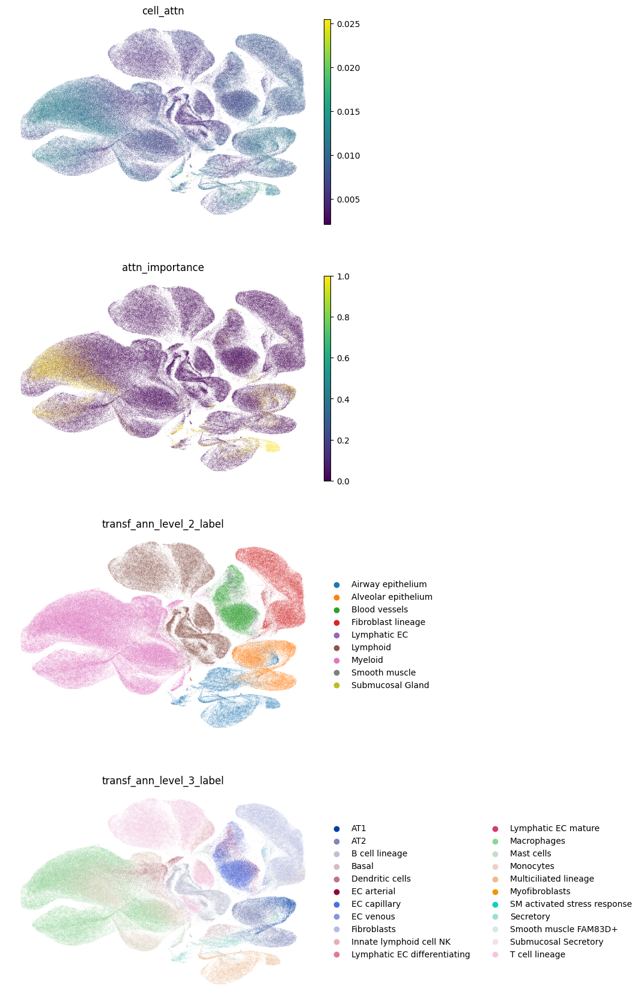

In [40]:
sc.pl.umap(
    adata, 
    color=[
        'cell_attn',
        'attn_importance',
        'transf_ann_level_2_label',
        'transf_ann_level_3_label',
    ],
    frameon=False,
    ncols=1,
)

COPD


/Users/anastasia.litinetska/mambaforge/envs/sc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/anastasia.litinetska/mambaforge/envs/sc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


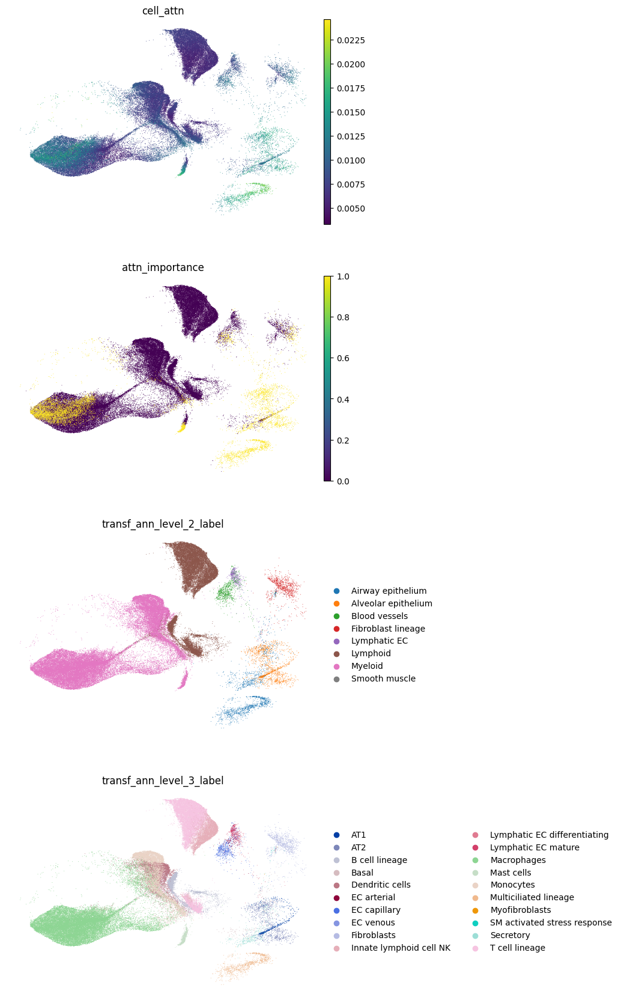

COVID-19


/Users/anastasia.litinetska/mambaforge/envs/sc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/anastasia.litinetska/mambaforge/envs/sc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


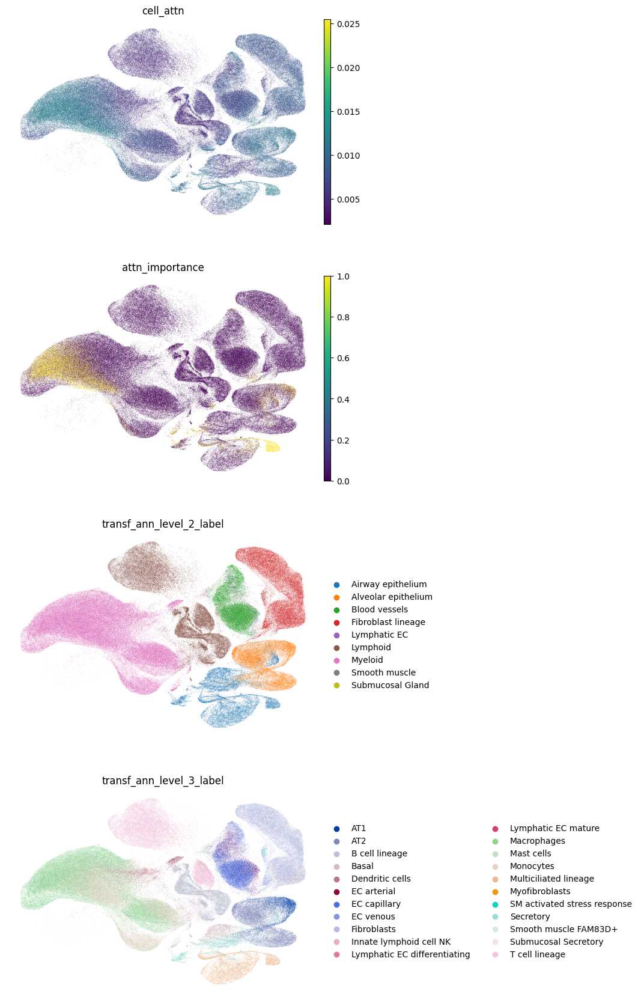

In [41]:
for condition in np.unique(adata.obs['lung_condition_coarse']):
    print(condition)
    sc.pl.umap(
        adata[adata.obs['lung_condition_coarse'] == condition], 
        color=[
            'cell_attn',
            'attn_importance',
            'transf_ann_level_2_label',
            'transf_ann_level_3_label',
        ],
        frameon=False,
        ncols=1,
    )


In [43]:
df = adata.obs[['cell_attn', 'attn_importance', 'transf_ann_level_3_label', 'lung_condition_coarse']]
df

,cell_attn,attn_importance,transf_ann_level_3_label,lung_condition_coarse
052CO-a_CGGACGTAGACGACGT_adams,0.011100,1.0,EC capillary,COPD
052CO-a_TTCTTAGTCCATGCTC_adams,0.007245,0.0,Macrophages,COPD
052CO-a_CCGGGATGTCTTCGTC_adams,0.009052,0.0,Monocytes,COPD
052CO-a_CAGAATCGTAGAGCTG_adams,0.008397,0.0,Macrophages,COPD
052CO-a_ATAAGAGTCGGGAGTA_adams,0.007105,0.0,Innate lymphoid cell NK,COPD
...,...,...,...,...
GCGCAGTTCTATCGCC-6_grant_fresh,0.011247,1.0,Monocytes,COVID-19
TGCCCATCACACCGAC-6_grant_fresh,0.005978,0.0,T cell lineage,COVID-19
GTTCATTAGTGGTCCC-6_grant_fresh,0.013519,1.0,Monocytes,COVID-19
AGGCCGTCATCGACGC-6_grant_fresh,0.004456,0.0,Dendritic cells,COVID-19


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21]),
 [Text(0, 0, 'AT1'),
  Text(1, 0, 'AT2'),
  Text(2, 0, 'B cell lineage'),
  Text(3, 0, 'Basal'),
  Text(4, 0, 'Dendritic cells'),
  Text(5, 0, 'EC arterial'),
  Text(6, 0, 'EC capillary'),
  Text(7, 0, 'EC venous'),
  Text(8, 0, 'Fibroblasts'),
  Text(9, 0, 'Innate lymphoid cell NK'),
  Text(10, 0, 'Lymphatic EC differentiating'),
  Text(11, 0, 'Lymphatic EC mature'),
  Text(12, 0, 'Macrophages'),
  Text(13, 0, 'Mast cells'),
  Text(14, 0, 'Monocytes'),
  Text(15, 0, 'Multiciliated lineage'),
  Text(16, 0, 'Myofibroblasts'),
  Text(17, 0, 'SM activated stress response'),
  Text(18, 0, 'Secretory'),
  Text(19, 0, 'Smooth muscle FAM83D+'),
  Text(20, 0, 'Submucosal Secretory'),
  Text(21, 0, 'T cell lineage')])

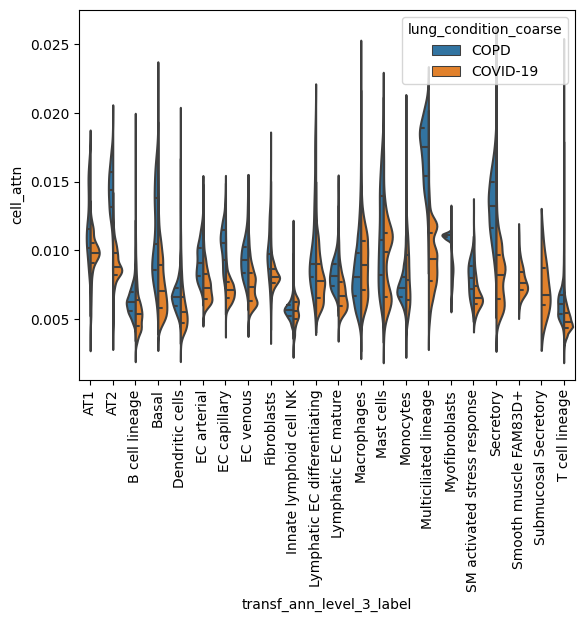

In [56]:
sns.violinplot(data=df, x="transf_ann_level_3_label", y="cell_attn", hue="lung_condition_coarse",
               split=True, inner="quart", fill=False)
plt.xticks(rotation=90)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21]),
 [Text(0, 0, 'AT1'),
  Text(1, 0, 'AT2'),
  Text(2, 0, 'B cell lineage'),
  Text(3, 0, 'Basal'),
  Text(4, 0, 'Dendritic cells'),
  Text(5, 0, 'EC arterial'),
  Text(6, 0, 'EC capillary'),
  Text(7, 0, 'EC venous'),
  Text(8, 0, 'Fibroblasts'),
  Text(9, 0, 'Innate lymphoid cell NK'),
  Text(10, 0, 'Lymphatic EC differentiating'),
  Text(11, 0, 'Lymphatic EC mature'),
  Text(12, 0, 'Macrophages'),
  Text(13, 0, 'Mast cells'),
  Text(14, 0, 'Monocytes'),
  Text(15, 0, 'Multiciliated lineage'),
  Text(16, 0, 'Myofibroblasts'),
  Text(17, 0, 'SM activated stress response'),
  Text(18, 0, 'Secretory'),
  Text(19, 0, 'Smooth muscle FAM83D+'),
  Text(20, 0, 'Submucosal Secretory'),
  Text(21, 0, 'T cell lineage')])

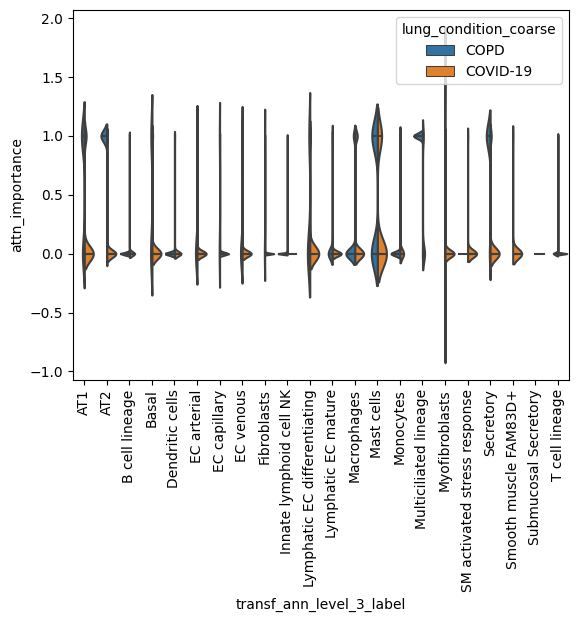

In [57]:
sns.violinplot(data=df, x="transf_ann_level_3_label", y="attn_importance", hue="lung_condition_coarse",
               split=True, inner="quart", fill=False)
plt.xticks(rotation=90)

## AT1

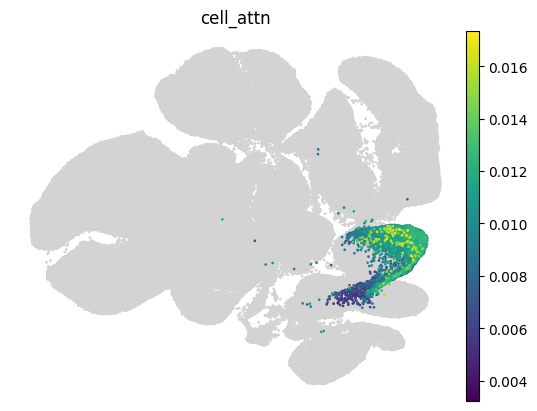

In [77]:
fig, ax = plt.subplots()
sc.pl.umap(adata, ax=ax, show=False, size=15)
sc.pl.umap(adata[adata.obs['transf_ann_level_3_label'] == 'AT1'], size=15,
          color='cell_attn', frameon=False, ax=ax
)

COPD


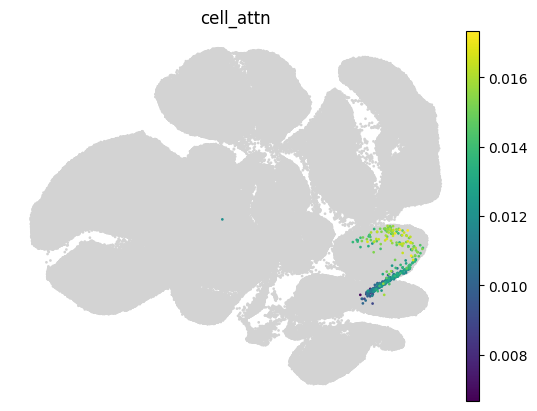

COVID-19


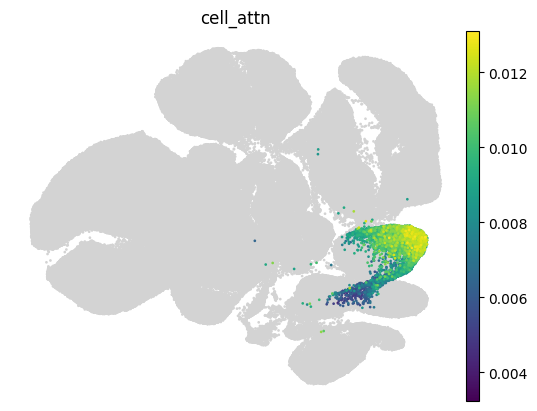

In [76]:
for condition in np.unique(adata.obs['lung_condition_coarse']):
    print(condition)
    tmp = adata[adata.obs['lung_condition_coarse'] == condition]
    fig, ax = plt.subplots()
    sc.pl.umap(adata, ax=ax, show=False, size=15)
    sc.pl.umap(
        tmp[tmp.obs['transf_ann_level_3_label'] == 'AT1'], size=15,
          color='cell_attn', frameon=False, ax=ax
    )

COPD


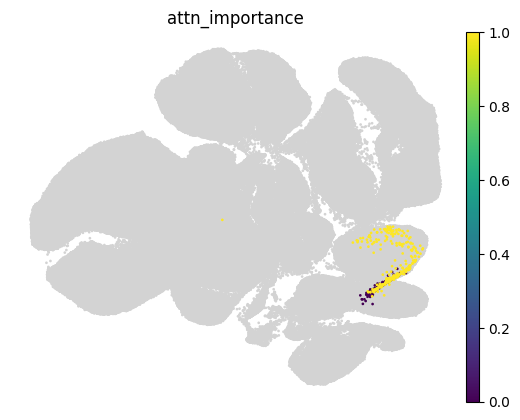

COVID-19


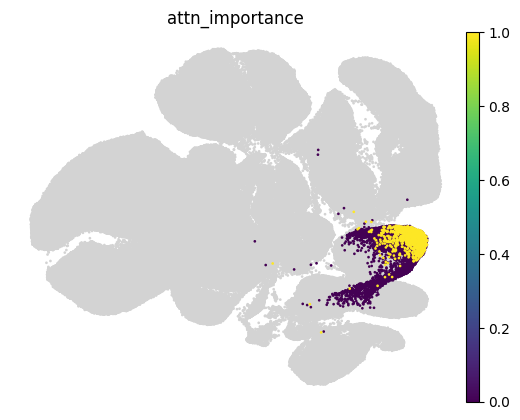

In [75]:
for condition in np.unique(adata.obs['lung_condition_coarse']):
    print(condition)
    tmp = adata[adata.obs['lung_condition_coarse'] == condition]
    fig, ax = plt.subplots()
    sc.pl.umap(adata, ax=ax, show=False, size=15)
    sc.pl.umap(
        tmp[tmp.obs['transf_ann_level_3_label'] == 'AT1'], size=15,
          color='attn_importance', frameon=False, ax=ax
    )

## AT2

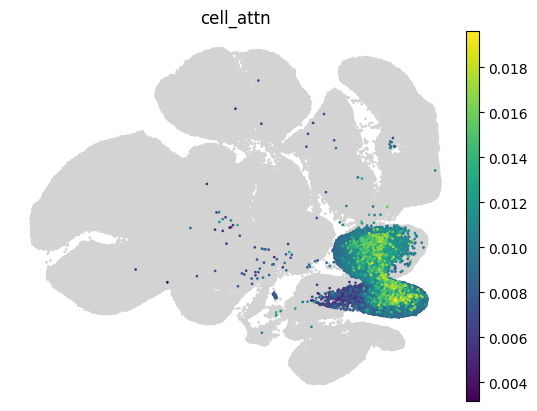

In [79]:
fig, ax = plt.subplots()
sc.pl.umap(adata, ax=ax, show=False, size=15)
sc.pl.umap(adata[adata.obs['transf_ann_level_3_label'] == 'AT2'], size=15,
          color='cell_attn', frameon=False, ax=ax
)

COPD


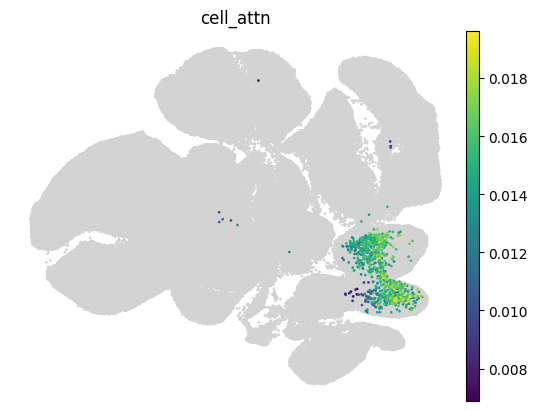

COVID-19


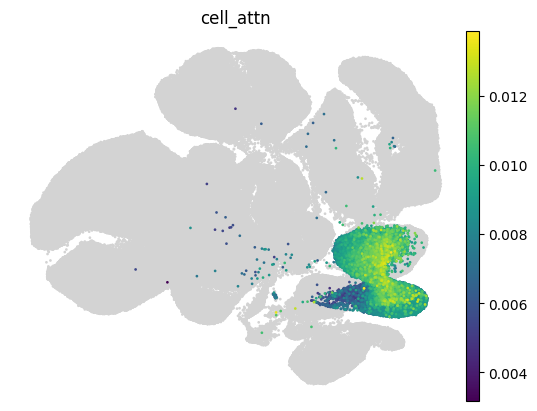

In [74]:
for condition in np.unique(adata.obs['lung_condition_coarse']):
    print(condition)
    tmp = adata[adata.obs['lung_condition_coarse'] == condition]
    fig, ax = plt.subplots()
    sc.pl.umap(adata, ax=ax, show=False, size=15)
    sc.pl.umap(
        tmp[tmp.obs['transf_ann_level_3_label'] == 'AT2'], size=15,
          color='cell_attn', frameon=False, ax=ax
    )

COPD


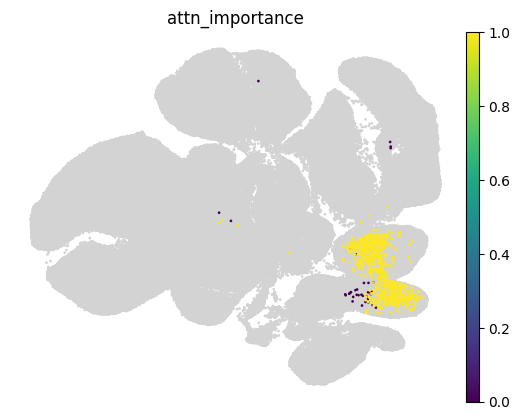

COVID-19


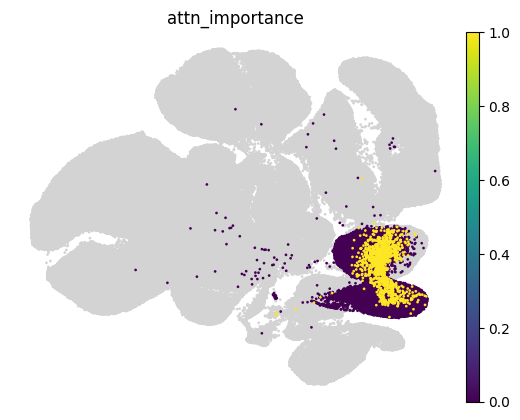

In [73]:
for condition in np.unique(adata.obs['lung_condition_coarse']):
    print(condition)
    tmp = adata[adata.obs['lung_condition_coarse'] == condition]
    fig, ax = plt.subplots()
    sc.pl.umap(adata, ax=ax, show=False, size=15)
    sc.pl.umap(
        tmp[tmp.obs['transf_ann_level_3_label'] == 'AT2'], size=15,
          color='attn_importance', frameon=False, ax=ax
    )


## Mast

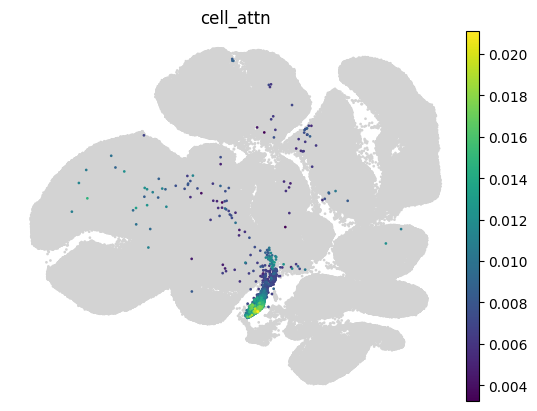

In [82]:
fig, ax = plt.subplots()
sc.pl.umap(adata, ax=ax, show=False, size=15)
sc.pl.umap(adata[adata.obs['transf_ann_level_3_label'] == 'Mast cells'], size=15,
          color='cell_attn', frameon=False, ax=ax
)

COPD


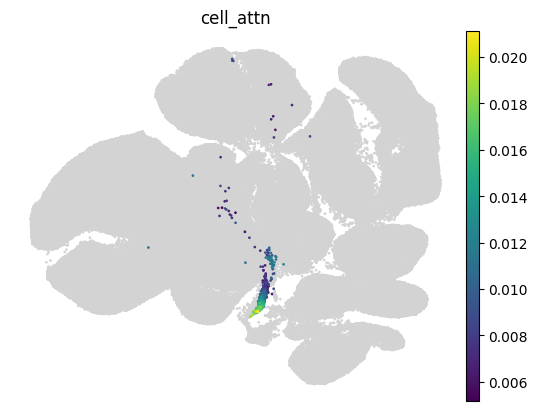

COVID-19


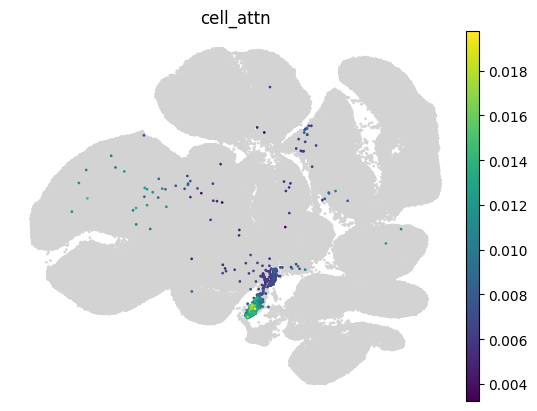

In [83]:
for condition in np.unique(adata.obs['lung_condition_coarse']):
    print(condition)
    tmp = adata[adata.obs['lung_condition_coarse'] == condition]
    fig, ax = plt.subplots()
    sc.pl.umap(adata, ax=ax, show=False, size=15)
    sc.pl.umap(
        tmp[tmp.obs['transf_ann_level_3_label'] == 'Mast cells'], size=15,
          color='cell_attn', frameon=False, ax=ax
    )

COPD


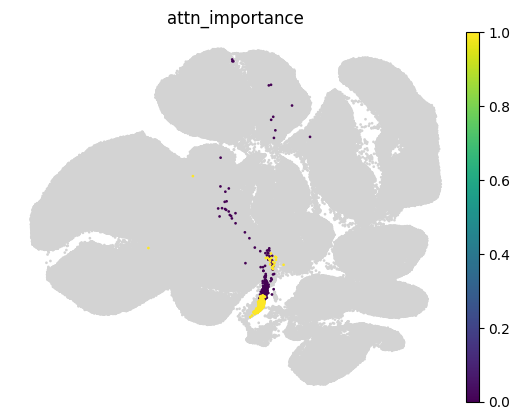

COVID-19


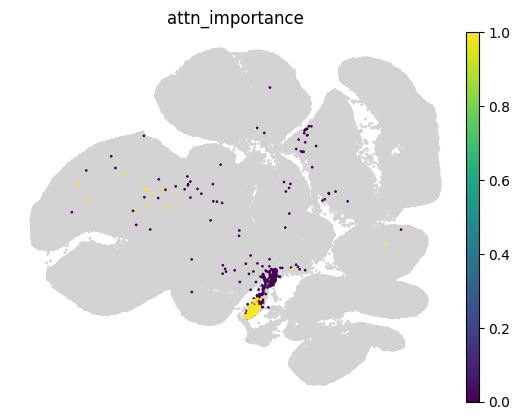

In [84]:
for condition in np.unique(adata.obs['lung_condition_coarse']):
    print(condition)
    tmp = adata[adata.obs['lung_condition_coarse'] == condition]
    fig, ax = plt.subplots()
    sc.pl.umap(adata, ax=ax, show=False, size=15)
    sc.pl.umap(
        tmp[tmp.obs['transf_ann_level_3_label'] == 'Mast cells'], size=15,
          color='attn_importance', frameon=False, ax=ax
    )

In [87]:
mast = adata[adata.obs['transf_ann_level_3_label'] == 'Mast cells'].copy()
mast

AnnData object with n_obs × n_vars = 1547 × 2000
    obs: "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ancestry', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'assay', 'cause_of_death', 'cell_type', 'core_or_extension', 'dataset', 'development_stage', 'disease', 'donor_id', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'reannotation_type', 'sample', 'scanvi_label', 'sequencing_platform', 'sex', 'smoking_status', 'study', 'subject_type', 'suspension_type', 'tissue', 'tissue_coarse_unharmonized', 'tissue_detailed_unharmonized', 'tissue_dissociation_protocol', 'tissue_level_2', 'tissue_level_3', 'tissue_sampling_method', 'total_counts', 'transf_ann_level_1_label', 'transf_ann_leve

In [88]:
sc.pp.neighbors(mast, use_rep='latent')

In [89]:
sc.tl.umap(mast)

In [98]:
sc.tl.leiden(mast, resolution=0.2)

/Users/anastasia.litinetska/mambaforge/envs/sc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/anastasia.litinetska/mambaforge/envs/sc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/anastasia.litinetska/mambaforge/envs/sc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


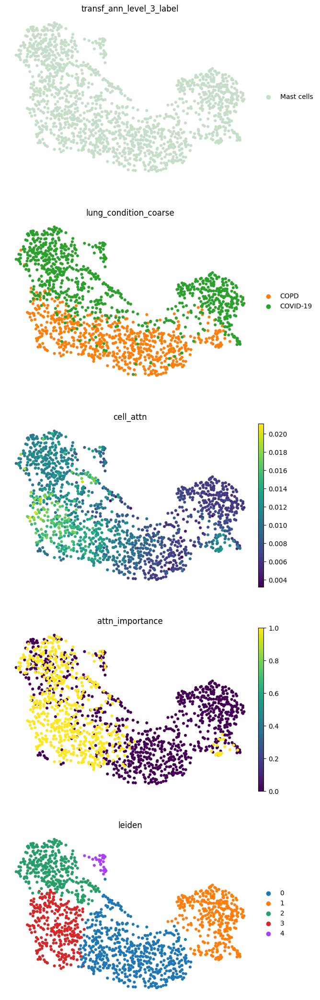

In [99]:
sc.pl.umap(
    mast, 
    color=['transf_ann_level_3_label', 'lung_condition_coarse', 'cell_attn', 'attn_importance', 'leiden'], 
    ncols=1, 
    frameon=False
)

In [101]:
mast_1 = mast[mast.obs['leiden'] == '1'].copy()
mast_1

AnnData object with n_obs × n_vars = 344 × 2000
    obs: "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ancestry', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'assay', 'cause_of_death', 'cell_type', 'core_or_extension', 'dataset', 'development_stage', 'disease', 'donor_id', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'reannotation_type', 'sample', 'scanvi_label', 'sequencing_platform', 'sex', 'smoking_status', 'study', 'subject_type', 'suspension_type', 'tissue', 'tissue_coarse_unharmonized', 'tissue_detailed_unharmonized', 'tissue_dissociation_protocol', 'tissue_level_2', 'tissue_level_3', 'tissue_sampling_method', 'total_counts', 'transf_ann_level_1_label', 'transf_ann_level

In [102]:
mast_0 = mast[mast.obs['leiden'] != '1'].copy()
mast_0

AnnData object with n_obs × n_vars = 1203 × 2000
    obs: "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ancestry', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'assay', 'cause_of_death', 'cell_type', 'core_or_extension', 'dataset', 'development_stage', 'disease', 'donor_id', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'reannotation_type', 'sample', 'scanvi_label', 'sequencing_platform', 'sex', 'smoking_status', 'study', 'subject_type', 'suspension_type', 'tissue', 'tissue_coarse_unharmonized', 'tissue_detailed_unharmonized', 'tissue_dissociation_protocol', 'tissue_level_2', 'tissue_level_3', 'tissue_sampling_method', 'total_counts', 'transf_ann_level_1_label', 'transf_ann_leve

In [107]:
sc.pp.normalize_total(mast_0, target_sum=1e4)
sc.pp.log1p(mast_0)

In [109]:
sc.tl.rank_genes_groups(mast_0, 'lung_condition_coarse', method='wilcoxon')

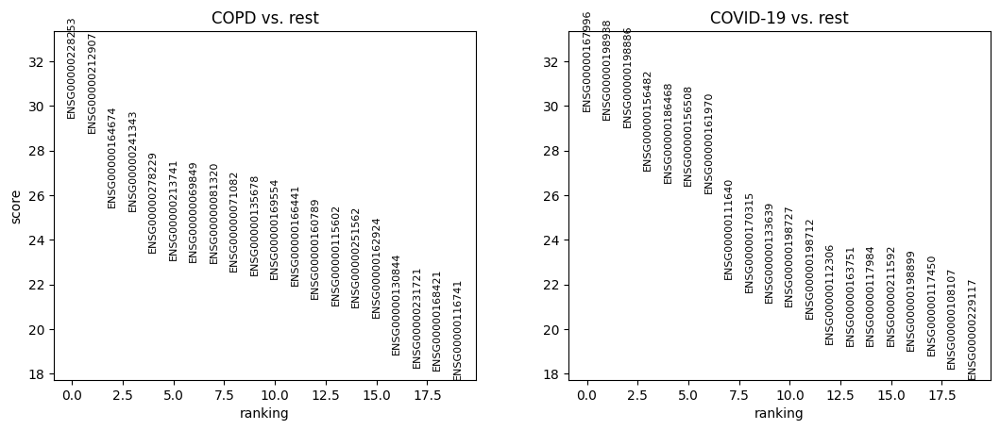

In [110]:
# COPD both random MT genes
sc.pl.rank_genes_groups(mast_0)

In [111]:
sc.pp.normalize_total(mast_1, target_sum=1e4)
sc.pp.log1p(mast_1)

In [112]:
sc.tl.rank_genes_groups(mast_1, 'lung_condition_coarse', method='wilcoxon')

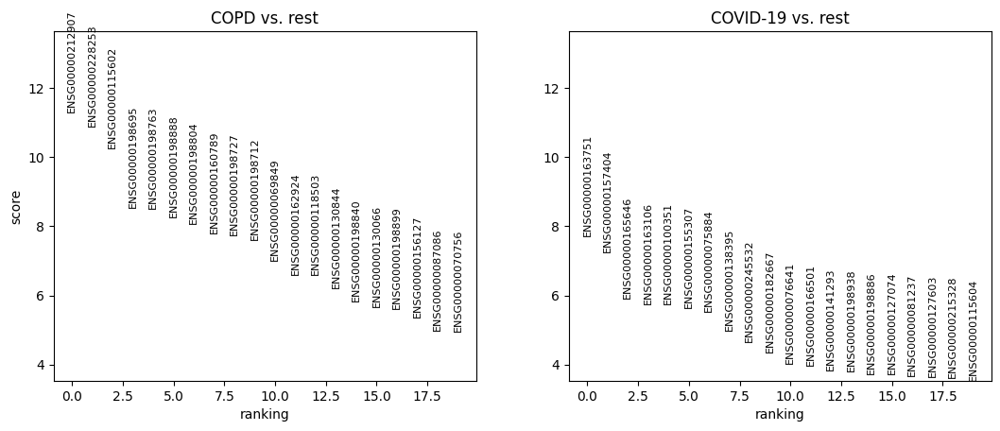

In [113]:
# same random MT genes and IL1RL1 -> actually sort of reported to be assosiated with COPD in mast cells??
# https://www.ncbi.nlm.nih.gov/pmc/articles/PMC9512688/
# https://thorax.bmj.com/content/78/4/335
# 
sc.pl.rank_genes_groups(mast_1)

In [52]:
adata = sc.read_h5ad('../../../data/multimil_output/adata_full2.h5ad')
adata

AnnData object with n_obs × n_vars = 2149684 × 2000
    obs: "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ancestry', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'assay', 'cause_of_death', 'cell_type', 'core_or_extension', 'dataset', 'development_stage', 'disease', 'donor_id', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'reannotation_type', 'sample', 'scanvi_label', 'sequencing_platform', 'sex', 'smoking_status', 'study', 'subject_type', 'suspension_type', 'tissue', 'tissue_coarse_unharmonized', 'tissue_detailed_unharmonized', 'tissue_dissociation_protocol', 'tissue_level_2', 'tissue_level_3', 'tissue_sampling_method', 'total_counts', 'transf_ann_level_1_label', 'transf_ann_l

In [53]:
mast = adata[adata.obs['transf_ann_level_3_label'] == 'Mast cells'].copy()
mast

AnnData object with n_obs × n_vars = 13656 × 2000
    obs: "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ancestry', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'assay', 'cause_of_death', 'cell_type', 'core_or_extension', 'dataset', 'development_stage', 'disease', 'donor_id', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'reannotation_type', 'sample', 'scanvi_label', 'sequencing_platform', 'sex', 'smoking_status', 'study', 'subject_type', 'suspension_type', 'tissue', 'tissue_coarse_unharmonized', 'tissue_detailed_unharmonized', 'tissue_dissociation_protocol', 'tissue_level_2', 'tissue_level_3', 'tissue_sampling_method', 'total_counts', 'transf_ann_level_1_label', 'transf_ann_lev

In [54]:
sc.pp.neighbors(mast, use_rep='latent')

In [55]:
sc.tl.umap(mast)

/Users/anastasia.litinetska/mambaforge/envs/sc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


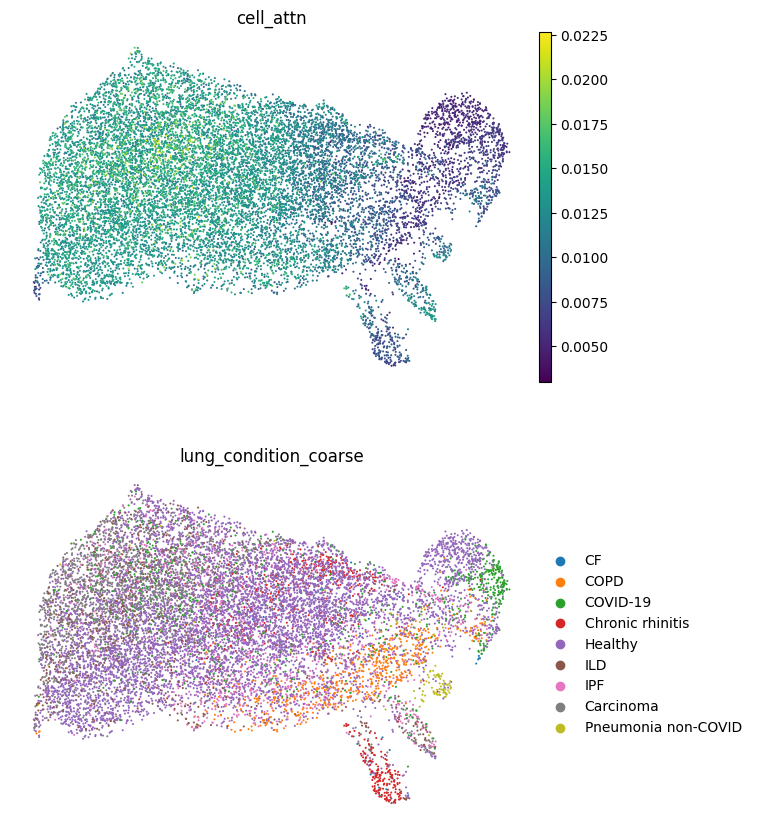

In [56]:
sc.pl.umap(mast, color=['cell_attn', 'lung_condition_coarse'], ncols=1, frameon=False)

CF


/Users/anastasia.litinetska/mambaforge/envs/sc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(


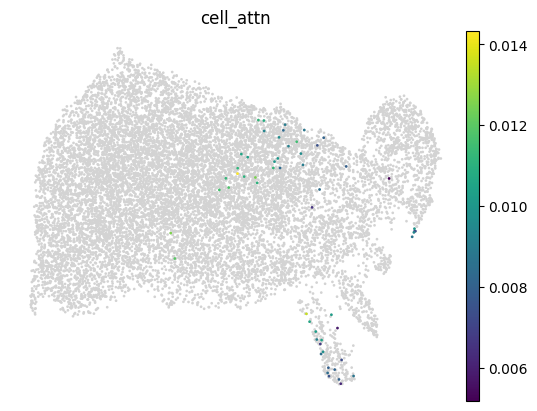

COPD


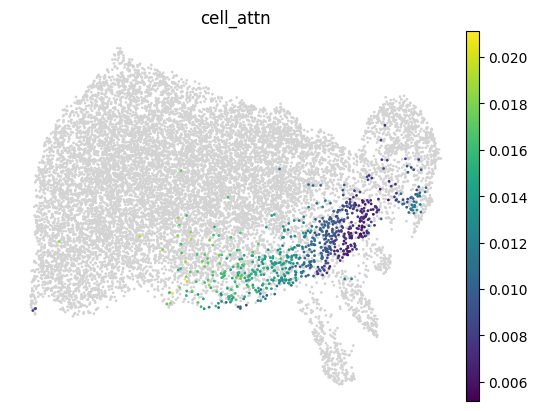

COVID-19


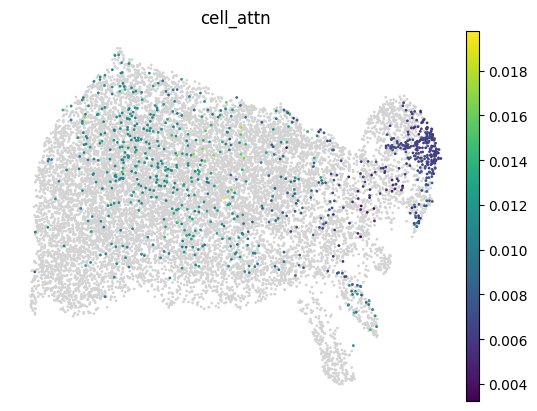

Carcinoma


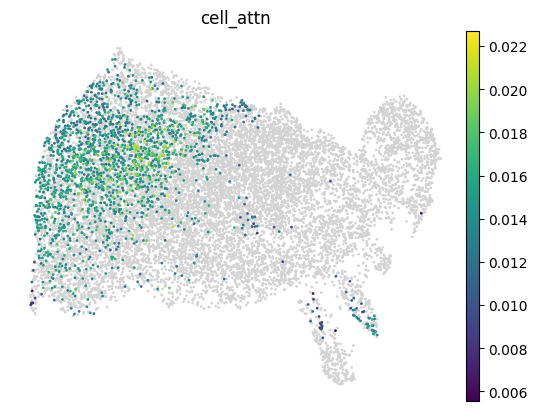

Chronic rhinitis


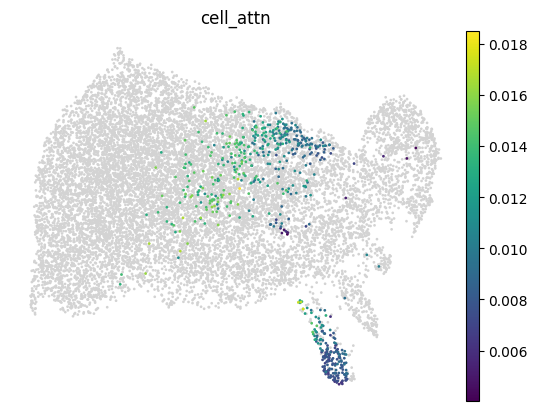

Healthy


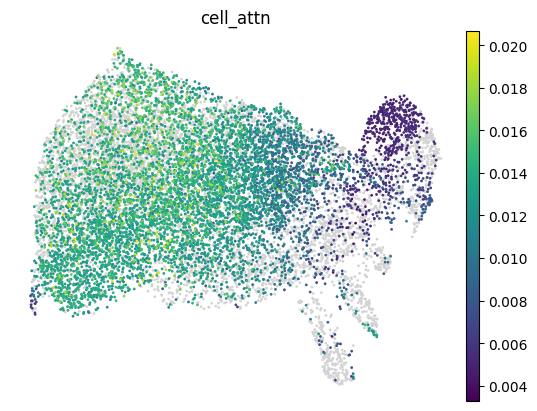

ILD


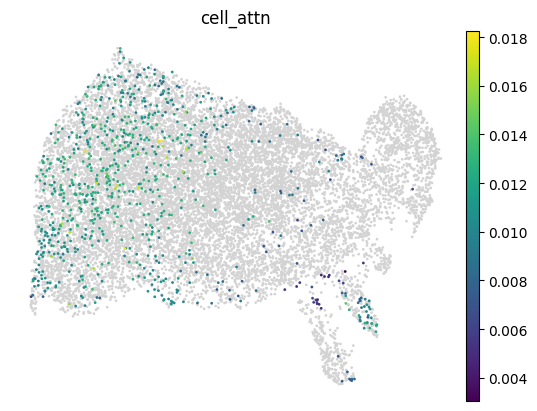

IPF


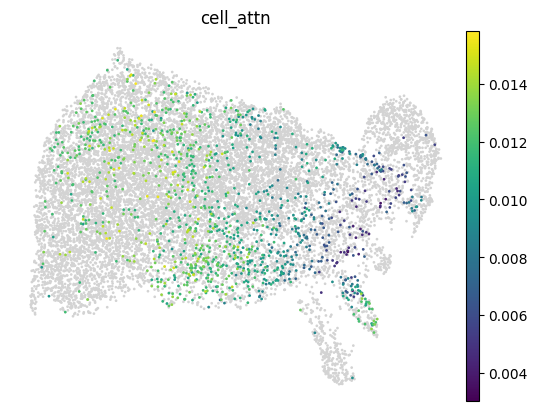

Pneumonia non-COVID


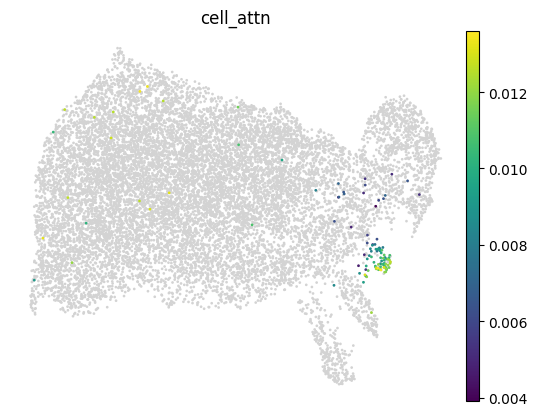

In [57]:
for condition in np.unique(mast.obs['lung_condition_coarse']):
    print(condition)
    tmp = mast[mast.obs['lung_condition_coarse'] == condition]
    fig, ax = plt.subplots()
    sc.pl.umap(mast, ax=ax, show=False, size=15)
    sc.pl.umap(
        tmp[tmp.obs['transf_ann_level_3_label'] == 'Mast cells'], size=15,
          color='cell_attn', frameon=False, ax=ax
    )

# z */+ attn

In [1]:
from sklearn.preprocessing import normalize

In [17]:
adata.obsm['norm_latent'] = normalize((adata.obsm['latent'].T - np.min(adata.obsm['latent'], axis=1)).T, norm='max', axis=1)

In [20]:
sc.pp.neighbors(adata, use_rep='norm_latent')

In [21]:
sc.tl.umap(adata)

/Users/anastasia.litinetska/mambaforge/envs/sc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/anastasia.litinetska/mambaforge/envs/sc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


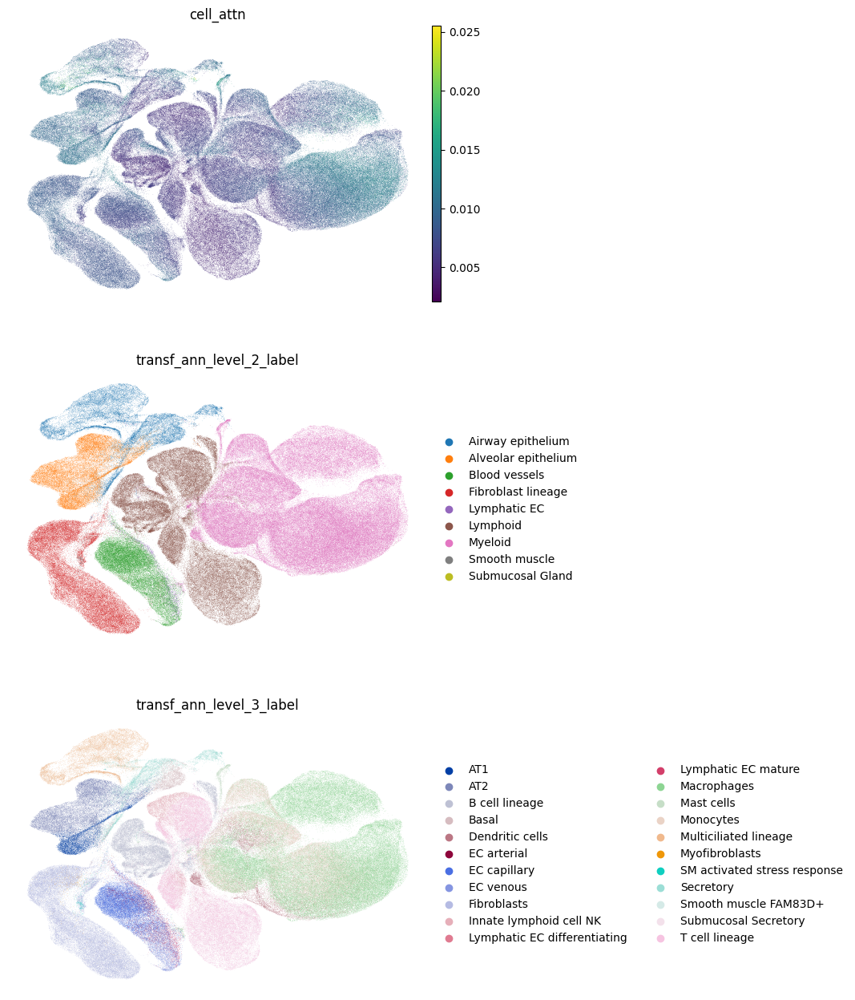

In [22]:
sc.pl.umap(
    adata,
    color=['cell_attn',
            'transf_ann_level_2_label',
            'transf_ann_level_3_label',
          ],
    ncols=1,
    frameon=False,
)

## multiplication

In [33]:
adata.obsm['norm_latent_times_z'] = np.multiply(adata.obsm['norm_latent'], np.array(adata.obs['cell_attn']).reshape(-1, 1))

In [34]:
sc.pp.neighbors(adata, use_rep='norm_latent_times_z')

In [35]:
sc.tl.umap(adata)

/Users/anastasia.litinetska/mambaforge/envs/sc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/anastasia.litinetska/mambaforge/envs/sc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


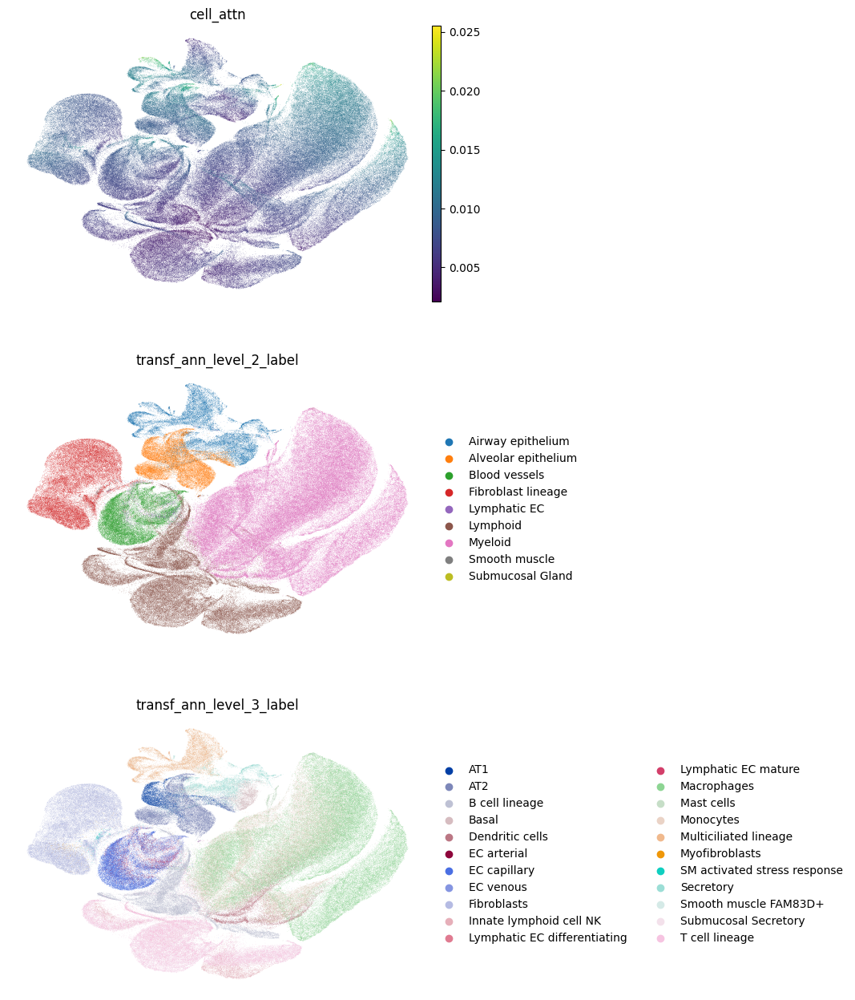

In [36]:
sc.pl.umap(
    adata,
    color=['cell_attn',
            'transf_ann_level_2_label',
            'transf_ann_level_3_label',
          ],
    ncols=1,
    frameon=False,
)

## addition

In [43]:
adata.obsm['norm_latent_plus_z'] = adata.obsm['norm_latent'] + np.array(adata.obs['cell_attn']).reshape(-1, 1)

In [44]:
sc.pp.neighbors(adata, use_rep='norm_latent_plus_z')

In [45]:
sc.tl.umap(adata)

/Users/anastasia.litinetska/mambaforge/envs/sc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/anastasia.litinetska/mambaforge/envs/sc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


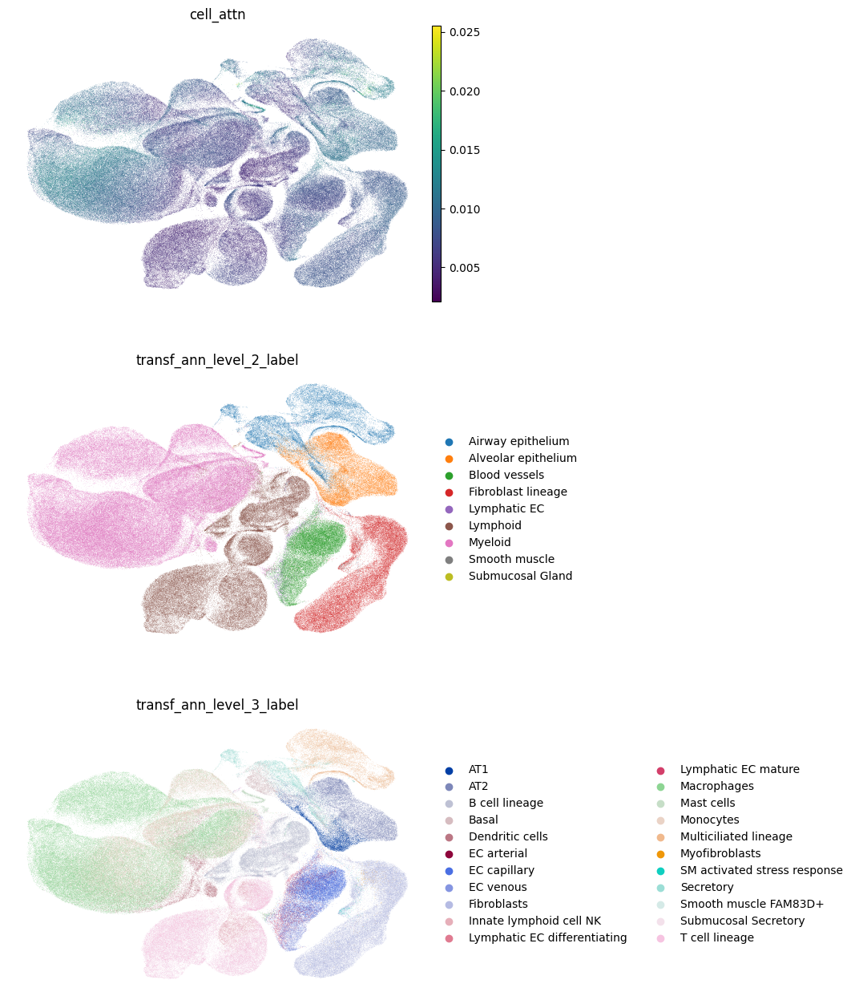

In [46]:
sc.pl.umap(
    adata,
    color=['cell_attn',
            'transf_ann_level_2_label',
            'transf_ann_level_3_label',
          ],
    ncols=1,
    frameon=False,
)

In [51]:
adata.obsm['norm_latent_plus_z']

array([[0.9463764 , 0.3124995 , 0.48537314, ..., 1.0110996 , 0.4118605 ,
        0.19817604],
       [0.67126054, 0.20696068, 0.84565365, ..., 1.0072445 , 0.5714544 ,
        0.30224758],
       [0.7444543 , 0.06387658, 0.88983935, ..., 1.0090519 , 0.5035209 ,
        0.25551873],
       ...,
       [0.8612025 , 0.01351919, 0.8331708 , ..., 1.0135192 , 0.49314356,
        0.3158677 ],
       [0.5312916 , 0.00445648, 0.83598936, ..., 1.0044565 , 0.55530983,
        0.40555716],
       [0.5721633 , 0.00517302, 0.85076165, ..., 0.9952599 , 0.5588824 ,
        0.45566434]], dtype=float32)

In [50]:
adata.obsm['norm_latent_times_z']

array([[0.0103812 , 0.00334542, 0.00526425, ..., 0.0110996 , 0.00444828,
        0.00207647],
       [0.00481046, 0.00144684, 0.00607386, ..., 0.0072445 , 0.00408742,
        0.00213715],
       [0.00665684, 0.00049627, 0.00797286, ..., 0.00905197, 0.00447592,
        0.00223101],
       ...,
       [0.01145999, 0.        , 0.01108103, ..., 0.01351919, 0.00648413,
        0.00408751],
       [0.00234783, 0.        , 0.00370571, ..., 0.00445648, 0.00245487,
        0.0017875 ],
       [0.00293305, 0.        , 0.00437425, ..., 0.00512174, 0.00286435,
        0.0023304 ]], dtype=float32)